In [2]:
## Importing necessary packages and libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

In [6]:
## Reading the dataset: patient-data.csv

patient_df = pd.read_csv('patient-data.csv')

print("The shape of the dataset is: ", patient_df.shape)

## Displaying the first few rows of the dataset



patient_df.head()

The shape of the dataset is:  (2371, 25)


,p01,p02,p03,p04,p05,p06,p07,p08,p09,p10,...,p16,p17,p18,p19,p20,p21,p22,p23,p24,Ailment
0,123.267876,178.595162,16.399606,410204.1015,8834.625206,4.809562,42.033429,92.318682,27.004825,35.257693,...,5.041603,81.518196,49.968044,11.828202,28.273439,97.398323,0.649258,0.018998,2.891522,Healthy
1,78.099990,125.917170,17.343260,421416.3821,7551.743543,4.650226,40.209919,85.496273,28.292545,34.059034,...,5.799974,109.089298,41.420259,40.000000,20.125301,85.016603,1.023012,0.033543,1.499165,Diabetes
2,102.281198,133.735334,15.709720,267971.2381,6030.085265,4.623836,46.893548,85.234094,32.408743,32.082015,...,4.964792,92.357938,48.048329,10.000000,25.097262,74.378111,0.862670,0.032801,2.929267,Thalasse
3,79.183690,125.291132,15.201283,204385.8555,4507.019659,4.352788,38.891841,93.113226,27.778412,34.040408,...,4.000000,70.448002,56.574596,18.282211,27.763620,65.041476,0.911120,0.026088,1.321096,Anemia
4,82.117428,187.164685,17.452967,384908.4868,7096.110188,4.696469,50.803614,88.335091,28.600120,35.299643,...,4.884780,77.147088,43.833396,10.259593,26.937302,92.952192,0.687618,0.032591,0.340852,Thalasse


In [7]:
##Describing the dataset
print(patient_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2371 entries, 0 to 2370
Data columns (total 25 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   p01      2371 non-null   float64
 1   p02      2371 non-null   float64
 2   p03      2370 non-null   float64
 3   p04      2370 non-null   float64
 4   p05      2370 non-null   float64
 5   p06      2370 non-null   float64
 6   p07      2370 non-null   float64
 7   p08      2370 non-null   float64
 8   p09      2370 non-null   float64
 9   p10      2370 non-null   float64
 10  p11      2370 non-null   float64
 11  p12      2370 non-null   float64
 12  p13      2370 non-null   float64
 13  p14      2370 non-null   float64
 14  p15      2369 non-null   float64
 15  p16      2369 non-null   float64
 16  p17      2370 non-null   float64
 17  p18      2370 non-null   float64
 18  p19      2370 non-null   float64
 19  p20      2370 non-null   float64
 20  p21      2370 non-null   float64
 21  p22      2370 

#### From the information above, we see there is a mismatch between dataset size (number of rows) and the number of non-nulls in the columns. Except 'Ailment', every other column is of dtype float64. 

In [9]:
#describing stats of the dataset
print(patient_df.describe().T)

      count           mean           std       min            25%  \
p01  2371.0      95.723590     18.391307      70.0      79.045276   
p02  2371.0     157.056068     20.086634     125.0     140.428465   
p03  2370.0      15.875821      1.108117      13.5      14.841100   
p04  2370.0  299642.033487  92072.554351  150000.0  207236.904200   
p05  2370.0    7576.392817   1975.407145    4000.0    5779.743222   
p06  2370.0       4.781409      0.334514       4.2       4.475088   
p07  2370.0      45.176374      4.130930      38.0      42.006265   
p08  2370.0      89.368838      5.810423      80.0      85.074023   
p09  2370.0      30.012760      1.964813      27.0      28.292545   
p10  2370.0      34.288155      1.128564      32.0      33.440483   
p11  2370.0      13.853883      5.197321       5.0       8.966785   
p12  2370.0      21.549882      1.757576      18.5      20.182471   
p13  2370.0     103.698003      8.497371      90.0      96.340427   
p14  2370.0      68.951467      5.

In [10]:
## Counting the number of missing values in each column
print(patient_df.isnull().sum())

p01        0
p02        0
p03        1
p04        1
p05        1
p06        1
p07        1
p08        1
p09        1
p10        1
p11        1
p12        1
p13        1
p14        1
p15        2
p16        2
p17        1
p18        1
p19        1
p20        1
p21        1
p22        1
p23        0
p24        0
Ailment    2
dtype: int64


Ailment
Anemia           623
Healthy          556
Diabetes         539
Thalasse         508
Thromboc         123
Heart Disease     20
Name: count, dtype: int64


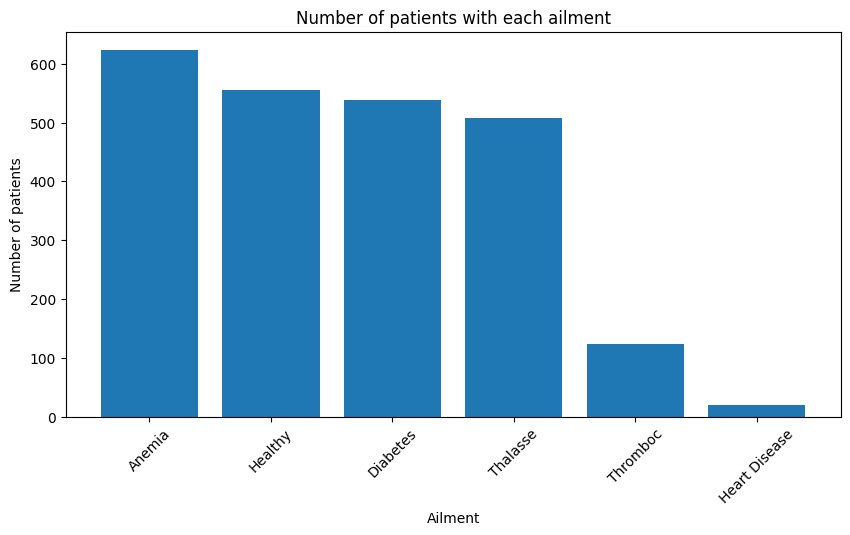

In [20]:
## The number of unique values of 'Ailment' with their counts
print(patient_df['Ailment'].value_counts())

## Bar plot of the number of patients with each ailment
plt.figure(figsize=(10, 5))
plt.bar(patient_df['Ailment'].value_counts().index, patient_df['Ailment'].value_counts().values)
plt.title('Number of patients with each ailment')
plt.xlabel('Ailment')
plt.ylabel('Number of patients')
plt.xticks(rotation=45)
plt.show()

#### The dataset is imbalanced as there is less representation of the ailment 'Heart Disease' and 'Thromboc'


In [ ]:
### Looking at the column where the ailment is missing
missing_ailment = patient_df[patient_df['Ailment'].isnull()]

missing_ailment.isnull().sum()


p01        0
p02        0
p03        0
p04        0
p05        0
p06        0
p07        0
p08        0
p09        0
p10        0
p11        0
p12        0
p13        0
p14        0
p15        0
p16        0
p17        0
p18        0
p19        0
p20        0
p21        0
p22        0
p23        0
p24        0
Ailment    2
dtype: int64

#### None of any other columns have null values. We can either use this as test set or due to lower number of instances (2) compared to the whole dataset size, remove these and other rows  that have any null values.

In [24]:
## Dropping rows with missing values
patient_df = patient_df.dropna()

patient_df.shape

(2367, 25)

In [25]:
###Splitting the dataset into features and target variable (assuming the last column 'Ailment' is the target variable)
X_features = patient_df.drop(columns=['Ailment'], axis=1, inplace=False)
y_ailment_label = patient_df['Ailment']


Text(0.5, 1.0, 'Correlation Heatmap')

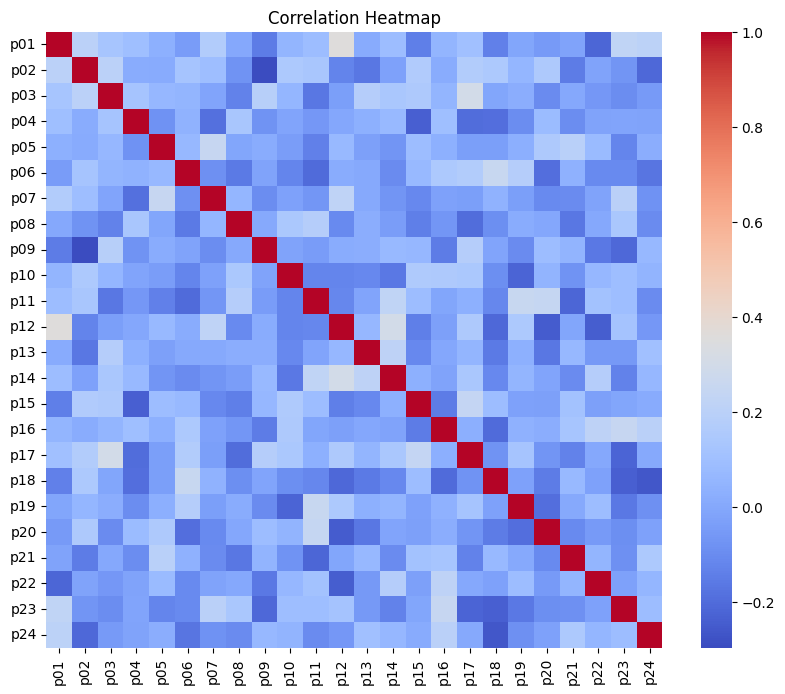

In [ ]:
X_features.corr()

## Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(X_features.corr(), annot=False, cmap='coolwarm', square=True)
plt.title('Correlation Heatmap')

#### There is little correlation (linear) between the features of this dataset. Multicollinearity is not expected.

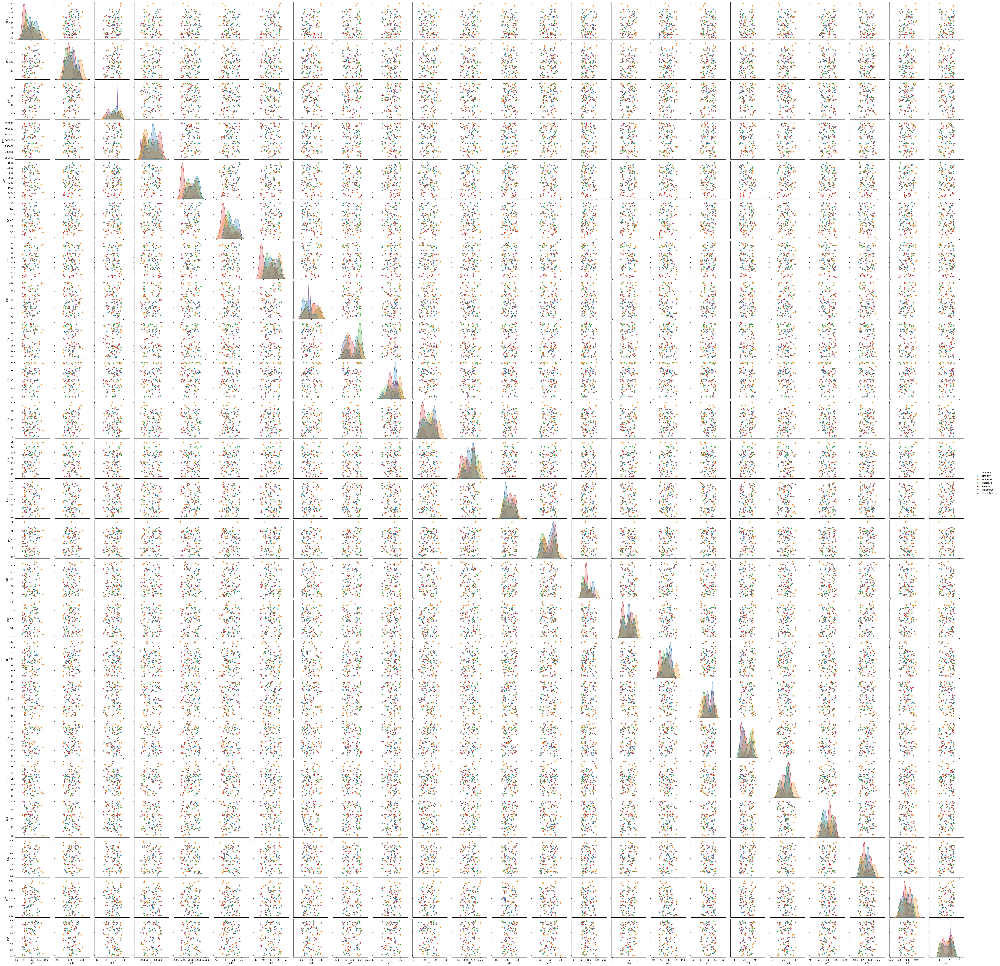

In [30]:
###Plotting the pairplot for visual understanding of the dataset
sns.pairplot(patient_df, hue='Ailment')


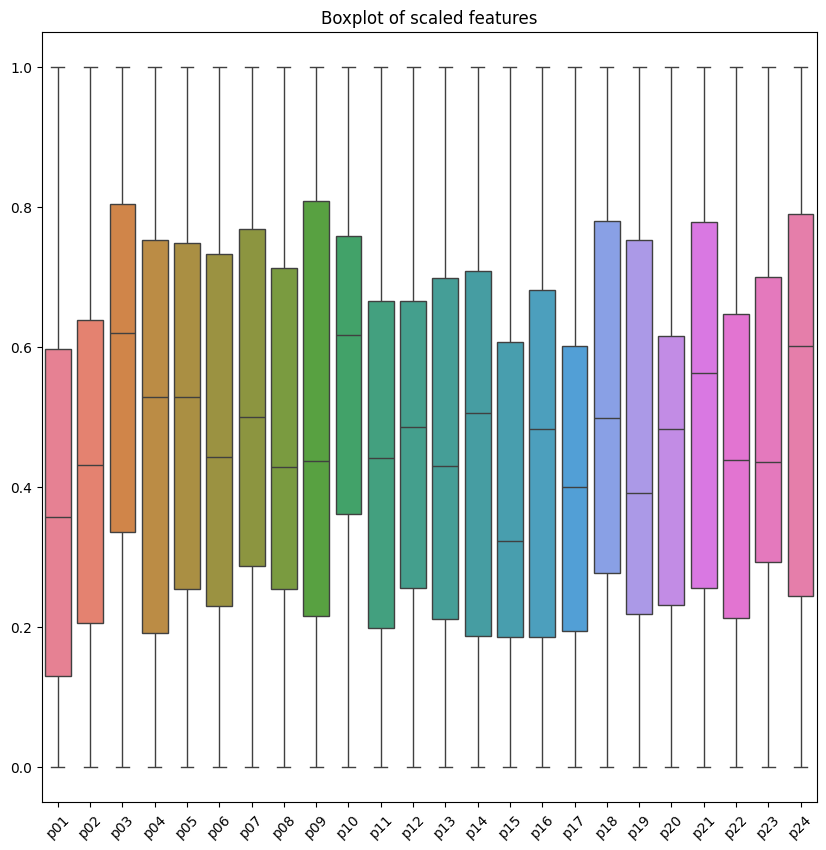

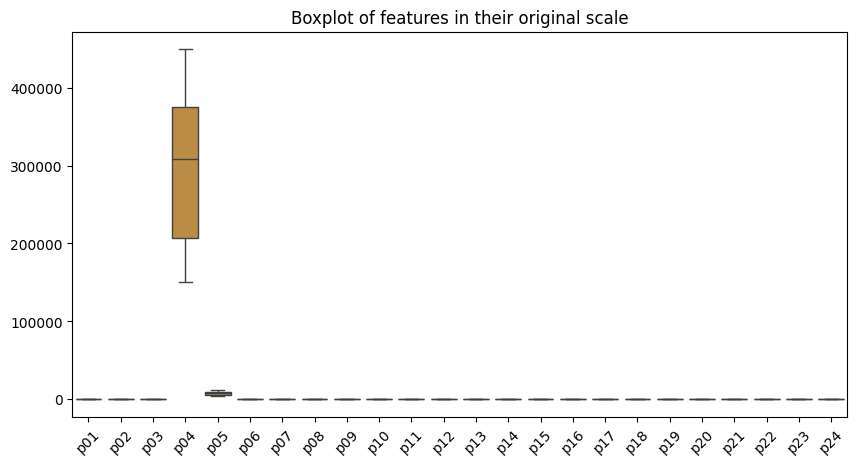

In [40]:
### Plotting the box plot of each feature

### Before that, let's normalize the values for better visualization
X_features_normalized = (X_features-X_features.min()) / (X_features.max() - X_features.min())
plt.figure(figsize=(10, 10))
sns.boxplot(data=X_features_normalized)
plt.title('Boxplot of scaled features')
plt.xticks(rotation=45)
plt.show()


plt.figure(figsize=(10, 5))
sns.boxplot(data = X_features)
plt.title('Boxplot of features in their original scale')
plt.xticks(rotation=45)
plt.show()


#### From the box plot visualization, it is apparent that there are no outliers in any of the features.
#### To conclude, 
#### this dataset is imbalanced, had very few missing values, features have different scales and there are no outliers. Features are also not strongly correlated to each other